<a href="https://colab.research.google.com/github/phu0n9/BigData_movie/blob/master/modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Import Library

### Import general library

In [ ]:
import pandas as pd 
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy import stats
from matplotlib import colors
import sklearn as sk
import datetime
import sys
import math 


### Import modeling library

In [ ]:
# Algorithms
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score,mean_squared_error
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler

In [ ]:
final_df = pd.read_csv("/content/drive/My Drive/Colab Notebooks/movies.csv", delimiter=",")

In [ ]:
final_df.columns.values

array(['imdb_id', 'title', 'original_title', 'date_published', 'duration',
       'revenue', 'year', 'popularity', 'actor_movie_count',
       'actor_movie_pop', 'actress_movie_count', 'actress_movie_pop',
       'director_movie_count', 'director_movie_pop', 'crew_count',
       'crew_pop', 'genre_list', 'genre_count', 'Comedy', 'Crime',
       'Drama', 'War', 'Horror', 'Adventure', 'Animation', 'Action',
       'Biography', 'Western', 'Family', 'Thriller', 'Mystery', 'Musical',
       'Fantasy', 'Sci-Fi', 'Romance', 'Documentary', 'History', 'Sport',
       'Music', 'Month', 'Day', 'budget', 'profit', 'ROI', 'total_votes',
       'mean_vote', 'median_vote', 'allgenders_18age_avg_vote',
       'allgenders_18age_votes', 'allgenders_30age_avg_vote',
       'allgenders_30age_votes', 'allgenders_45age_avg_vote',
       'allgenders_45age_votes', 'males_allages_avg_vote',
       'males_allages_votes', 'males_18age_avg_vote', 'males_18age_votes',
       'males_30age_avg_vote', 'males_30age_vo

# Modeling

## Classify ROI

In [ ]:
# X = final_df.drop(['imdb_id', 'title', 'original_title', 'date_published','revenue', 'year','genre_list','ROI_group','profit', 'ROI', 
#        'duration',
#        'actor_movie_count',
#        'actress_movie_count',
#        'director_movie_count', 
#        'crew_count', 
#        'crew_pop', 
#        'genre_count', 
#        'Comedy', 
#        'Crime', 
#        'Drama', 
#        'War', 
#        'Horror',
#        'Adventure', 
#        'Animation', 
#        'Action', 
#        'Biography', 
#        'Western',
#        'Family', 
#        'Thriller', 
#        'Mystery', 
#        'Musical', 
#        'Fantasy', 
#        'Sci-Fi',
#        'Romance', 
#        'Documentary', 
#        'History', 
#        'Sport', 
#        'Music',
#        'total_votes', 
#        'mean_vote',
#        'median_vote', 
#        'allgenders_18age_avg_vote', 
#        'allgenders_30age_avg_vote', 
#       #  'allgenders_45age_votes', 
#       # 'allgenders_18age_votes',
#        'allgenders_45age_avg_vote', 
#        'allgenders_30age_votes',
#        'males_allages_avg_vote',
#        'males_allages_votes', 
#        'males_18age_avg_vote',
#       #  'males_18age_votes', 
#        'males_30age_votes',
#        'males_30age_avg_vote',
#        'males_45age_avg_vote', 
#        'males_45age_votes',
#        'females_allages_avg_vote', 
#        'females_allages_votes',
#        'females_18age_avg_vote',
#        'females_30age_avg_vote', 
#        'females_30age_votes',
#        'females_45age_avg_vote',
#        'females_45age_votes',
#       #  'females_18age_votes',
#        'us_voters_rating', 
#        'non_us_voters_rating',
#       #  'non_us_voters_votes',
#         'overview_count', 
#        'is_original_title',
#         'users_or_critics',
#         'actor_movie_pop',
#         'actress_movie_pop',
#         'director_movie_pop',
#         'Day',
#         'Month',
#         'popularity'
#         ], axis=1)
X = final_df[['budget','allgenders_18age_votes','allgenders_45age_votes',
              'males_18age_votes','females_18age_votes','us_voters_votes','non_us_voters_votes']]
Y = final_df[['ROI_group']]
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

In [ ]:
X

,budget,allgenders_18age_votes,allgenders_45age_votes,males_18age_votes,females_18age_votes,us_voters_votes,non_us_voters_votes
0,4.800000e+07,14001.0,10970.0,5506.0,8302.0,14442.0,37733.0
1,3.000000e+06,27231.0,26369.0,21040.0,5918.0,31884.0,66596.0
2,7.142850e+07,1654.0,463.0,1500.0,146.0,614.0,3005.0
3,4.821431e+04,4783.0,5459.0,3884.0,856.0,6529.0,14265.0
4,1.800000e+05,1222.0,949.0,923.0,281.0,1035.0,2902.0
...,...,...,...,...,...,...,...
9277,1.000000e+05,13622.0,4921.0,10956.0,2444.0,7351.0,21432.0
9278,4.000000e+06,77.0,14.0,57.0,19.0,8.0,165.0
9279,2.800000e+06,954.0,730.0,732.0,208.0,1050.0,1992.0
9280,8.852060e+03,72.0,111.0,49.0,22.0,12.0,305.0


### Pre-processing

`Using grid search to select the best accuracy`

In [ ]:
# Create parameters grid which contains value of parameters needed to be tuned
param_grid = [{'criterion':['gini','entropy'],'max_depth': list(range(5,10))}]
# Create GridSearchCV object which uses K-Fold cross-validation to tune (10-Fold cross validation)
grid_search = GridSearchCV(DecisionTreeClassifier(random_state= 0),param_grid, scoring='accuracy',verbose=1)
grid_search.fit(X_train, Y_train)
# Print out the best parameters of classification
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)
print("Best estimator: ", grid_search.best_estimator_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Best parameters:  {'criterion': 'gini', 'max_depth': 6}
Best score:  0.765925925925926
Best estimator:  DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=0, splitter='best')


[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    2.3s finished


### Stochastic Gradient Descent (SGD)

In [ ]:
sgd = linear_model.SGDClassifier(max_iter=5, tol=None)
sgd.fit(X_train, Y_train)
Y_pred = sgd.predict(X_test)

sgd.score(X_train, Y_train)

acc_sgd = accuracy_score(Y_test,Y_pred) * 100

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


### Random Forest

In [ ]:
random_forest = RandomForestClassifier(n_jobs=-1,random_state=0,max_features=4)
random_forest.fit(X_train, Y_train.values.ravel())

Y_pred = random_forest.predict(X_test)

random_forest.score(X_train, Y_train)
acc_random_forest = accuracy_score(Y_test,Y_pred) * 100
print(f'{acc_random_forest:.5f}%')

77.70598%


In [ ]:
# from sklearn.model_selection import cross_val_predict
# from sklearn.metrics import confusion_matrix
# predictions = cross_val_predict(random_forest, X_train, Y_train.values.ravel(), cv=3)
# confusion_matrix(Y_train, predictions)

In [ ]:
# from sklearn.metrics import precision_score, recall_score

# print("Precision:", precision_score(Y_train, predictions))
# print("Recall:",recall_score(Y_train, predictions))

In [ ]:
# from sklearn.metrics import f1_score
# f1_score(Y_train, predictions)

In [ ]:
# from sklearn.metrics import precision_recall_curve

# # getting the probabilities of our predictions
# y_scores = random_forest.predict_proba(X_train)
# y_scores = y_scores[:,1]

# precision, recall, threshold = precision_recall_curve(Y_train, y_scores)
# def plot_precision_and_recall(precision, recall, threshold):
#     plt.plot(threshold, precision[:-1], "r-", label="precision", linewidth=5)
#     plt.plot(threshold, recall[:-1], "b", label="recall", linewidth=5)
#     plt.xlabel("threshold", fontsize=19)
#     plt.legend(loc="upper right", fontsize=19)
#     plt.ylim([0, 1])

# plt.figure(figsize=(14, 7))
# plot_precision_and_recall(precision, recall, threshold)
# plt.show()

In [ ]:
# from sklearn.metrics import roc_curve
# # compute true positive rate and false positive rate
# false_positive_rate, true_positive_rate, thresholds = roc_curve(Y_train, y_scores)
# # plotting them against each other
# def plot_roc_curve(false_positive_rate, true_positive_rate, label=None):
#     plt.plot(false_positive_rate, true_positive_rate, linewidth=2, label=label)
#     plt.plot([0, 1], [0, 1], 'r', linewidth=4)
#     plt.axis([0, 1, 0, 1])
#     plt.xlabel('False Positive Rate (FPR)', fontsize=16)
#     plt.ylabel('True Positive Rate (TPR)', fontsize=16)

# plt.figure(figsize=(14, 7))
# plot_roc_curve(false_positive_rate, true_positive_rate)
# plt.show()

In [ ]:
# from sklearn.metrics import roc_auc_score
# r_a_score = roc_auc_score(Y_train, y_scores)
# print("ROC-AUC-Score:", r_a_score)

In [ ]:
importances = pd.DataFrame({'feature':X_train.columns,'importance':np.round(random_forest.feature_importances_,3)})
importances = importances.sort_values('importance',ascending=False).set_index('feature')
importances

,importance
feature,
us_voters_votes,0.297
allgenders_45age_votes,0.158
budget,0.130
non_us_voters_votes,0.115
females_18age_votes,0.111
allgenders_18age_votes,0.109
males_18age_votes,0.081


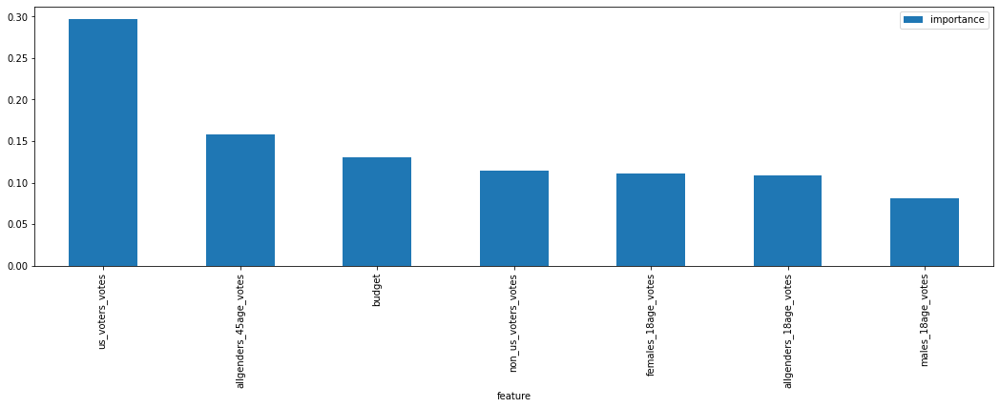

In [ ]:
importances.plot.bar(figsize=(18,5))

In [ ]:
# import os
# from sklearn.tree import export_graphviz
# import six
# import pydot
# from sklearn import tree
# dotfile = six.StringIO()
# i_tree = 0

# for tree_in_forest in estimator.estimators_:
#     export_graphviz(tree_in_forest,out_file='tree.dot',
#     feature_names=col,
#     filled=True,
#     rounded=True)
#     (graph,) = pydot.graph_from_dot_file('tree.dot')
#     name = 'tree' + str(i_tree)
#     graph.write_png(name+  '.png')
#     os.system('dot -Tpng tree.dot -o tree.png')
#     i_tree +=1

### Logistic Regression

In [ ]:
logreg = LogisticRegression()
logreg.fit(X_train, Y_train.values.ravel())

Y_pred = logreg.predict(X_test)

acc_log = accuracy_score(Y_test,Y_pred) * 100

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


### K Nearest Neighbor

In [ ]:
knn = KNeighborsClassifier(n_neighbors = 3) 
knn.fit(X_train, Y_train.values.ravel())  
Y_pred = knn.predict(X_test)  
acc_knn = accuracy_score(Y_test,Y_pred) * 100

### Gaussian Naive Bayes

In [ ]:
gaussian = GaussianNB() 
gaussian.fit(X_train, Y_train.values.ravel())  
Y_pred = gaussian.predict(X_test)  
acc_gaussian = accuracy_score(Y_test,Y_pred) * 100

### Perceptron

In [ ]:
perceptron = Perceptron(max_iter=25)
perceptron.fit(X_train, Y_train.values.ravel())

Y_pred = perceptron.predict(X_test)

acc_perceptron = accuracy_score(Y_test,Y_pred) * 100

### Linear Support Vector Machine

In [ ]:
linear_svc = LinearSVC()
linear_svc.fit(X_train, Y_train.values.ravel())

Y_pred = linear_svc.predict(X_test)

acc_linear_svc = accuracy_score(Y_test,Y_pred) * 100

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


### Decision Tree

In [ ]:
decision_tree = DecisionTreeClassifier(max_depth=9,random_state=0,min_samples_split=3,min_samples_leaf=7,min_impurity_decrease=0.0008) 
decision_tree.fit(X_train, Y_train.values.ravel())
Y_pred = decision_tree.predict(X_test)  
acc_decision_tree = accuracy_score(Y_test,Y_pred) * 100
print(acc_decision_tree)

78.51373182552504


In [ ]:
importances = pd.DataFrame({'feature':X_train.columns,'importance':np.round(decision_tree.feature_importances_,3)})
importances = importances.sort_values('importance',ascending=False).set_index('feature')
importances.head(20)

,importance
feature,
us_voters_votes,0.755
budget,0.106
females_18age_votes,0.036
non_us_voters_votes,0.033
allgenders_45age_votes,0.028
allgenders_18age_votes,0.026
males_18age_votes,0.018


In [ ]:
import graphviz
from sklearn import tree
dot_data = tree.export_graphviz(decision_tree, out_file='tree.dot',feature_names =list(X.columns.values),rounded = True, proportion = False, filled = True,special_characters=True,class_names=['loss','profit'])

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename='tree.png')

## Accuracy result

In [ ]:
results = pd.DataFrame({
    'Model': ['Support Vector Machines', 'KNN', 'Logistic Regression', 
              'Random Forest', 'Naive Bayes', 'Perceptron', 
              'Stochastic Gradient Decent', 
              'Decision Tree'],
    'Score': [acc_linear_svc, acc_knn, acc_log, 
              acc_random_forest, acc_gaussian, acc_perceptron, 
              acc_sgd, acc_decision_tree]})
result_df = results.sort_values(by='Score', ascending=False)
# result_df = result_df.set_index('Score')
print(result_df.to_string(index=False))

                      Model      Score
              Decision Tree  78.513732
              Random Forest  77.705977
                        KNN  69.951535
    Support Vector Machines  67.905223
                Naive Bayes  52.019386
        Logistic Regression  49.542272
                 Perceptron  49.542272
 Stochastic Gradient Decent  49.542272


## Predict Revenue

### Regression

In [ ]:
# X= final_df.drop(['imdb_id', 'title', 'original_title', 'date_published', 'revenue','year','genre_list', 'genre_count','profit', 'ROI','ROI_group',
#       #  'duration',
#       #  'popularity', 
#        'actor_movie_count',
#        'actor_movie_pop', 
#        'actress_movie_count', 
#        'actress_movie_pop',
#        'director_movie_count', 
#        'director_movie_pop', 
#        'crew_count',
#        'crew_pop',  
#        'Comedy', 
#        'Crime',
#        'Drama', 
#        'War', 
#        'Horror', 
#        'Adventure', 
#        'Animation', 
#        'Action',
#        'Biography', 
#        'Western', 
#        'Family', 
#        'Thriller', 
#        'Mystery', 
#        'Musical',
#        'Fantasy', 
#        'Sci-Fi', 
#        'Romance', 
#        'Documentary', 
#        'History', 
#        'Sport',
#        'Music', 
#        'Month', 
#        'Day', 
#       #  'budget', 
#       #  'total_votes',
#        'mean_vote', 
#        'median_vote', 
#        'allgenders_18age_avg_vote',
#        'allgenders_18age_votes',
#        'allgenders_30age_avg_vote',
#        'allgenders_30age_votes', 
#        'allgenders_45age_avg_vote',
#        'allgenders_45age_votes', 
#        'males_allages_avg_vote',
#        'males_allages_votes', 
#        'males_18age_avg_vote', 
#       #  'males_18age_votes',
#       #  'males_30age_avg_vote', 
#        'males_30age_votes',
#        'males_45age_avg_vote', 
#        'males_45age_votes',
#        'females_allages_avg_vote', 
#        'females_allages_votes',
#        'females_18age_avg_vote', 
#        'females_18age_votes',
#        'females_30age_avg_vote', 
#       #  'females_30age_votes',
#        'females_45age_avg_vote', 
#        'females_45age_votes',
#        'us_voters_rating', 
#       #  'us_voters_votes', 
#        'non_us_voters_rating',
#        'non_us_voters_votes', 
#        'overview_count', 
#        'is_original_title', 
#        'users_or_critics'
#       ],axis=1)	
X = final_df[['duration','popularity','budget','total_votes','males_18age_votes',
              'males_30age_avg_vote','females_30age_votes','us_voters_votes']]
Y = final_df[['revenue']]
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

In [ ]:
X

,duration,popularity,budget,total_votes,males_18age_votes,males_30age_avg_vote,females_30age_votes,us_voters_votes
0,118,7.196356,4.800000e+07,75298,5506.0,6.2,13963.0,14442.0
1,125,11.994281,3.000000e+06,148964,21040.0,8.2,10346.0,31884.0
2,197,0.283219,7.142850e+07,6484,1500.0,8.2,229.0,614.0
3,101,7.229587,4.821431e+04,27880,3884.0,7.7,1502.0,6529.0
4,88,2.394441,1.800000e+05,5405,923.0,7.2,261.0,1035.0
...,...,...,...,...,...,...,...,...
9277,92,24.339781,1.000000e+05,49515,10956.0,6.6,2442.0,7351.0
9278,75,0.468664,4.000000e+06,279,57.0,4.9,14.0,8.0
9279,87,12.560942,2.800000e+06,4976,732.0,5.2,335.0,1050.0
9280,85,0.313827,8.852060e+03,487,49.0,6.0,21.0,12.0


In [ ]:
np.var(X_test)

duration                3.248212e+02
popularity              1.244227e+02
budget                  7.668852e+22
total_votes             1.799079e+10
males_18age_votes       7.751825e+08
males_30age_avg_vote    1.113764e+00
females_30age_votes     7.187637e+07
us_voters_votes         4.634057e+08
dtype: float64

In [ ]:
# rf_regressor = RandomForestRegressor(random_state=0)
# rf_regressor.fit(X_train, Y_train.values.ravel())
# Y_pred = rf_regressor.predict(X_test)

In [ ]:
# acc_random_forest = r2_score(Y_test,Y_pred) * 100
# print(f'{acc_random_forest:.5f}')

In [ ]:
# importances = pd.DataFrame({'feature':X_train.columns,'importance':np.round(rf_regressor.feature_importances_,3)})
# importances = importances.sort_values('importance',ascending=False).set_index('feature')
# importances.head(20)

In [ ]:
# importances.plot.bar(figsize=(18,5))

In [ ]:
from sklearn.tree import DecisionTreeRegressor
regressor = DecisionTreeRegressor(random_state=0,max_depth=8)
regressor.fit(X_train, Y_train.values.ravel())
Y_pred = regressor.predict(X_test)
score = r2_score(Y_test,Y_pred) * 100
score

75.23493141838202

In [ ]:
importances = pd.DataFrame({'feature':X_train.columns,'importance':np.round(regressor.feature_importances_,3)})
importances = importances.sort_values('importance',ascending=False).set_index('feature')
importances.head(66)

,importance
feature,
males_18age_votes,0.430
budget,0.278
total_votes,0.109
duration,0.069
popularity,0.061
males_30age_avg_vote,0.018
females_30age_votes,0.018
us_voters_votes,0.016


In [ ]:
# plt.scatter(X_test.iloc[:,6],Y_pred,color='blue',label='Prediction')
# plt.scatter(X_test.iloc[:,6],Y_test,color='red',label='Actual')
# # plt.scatter(X_train.iloc[:,2],regressor.predict(X_train),color='blue')
# # plt.scatter(X_train.iloc[:,2],Y_train,color='red')
# plt.legend(loc='upper left')

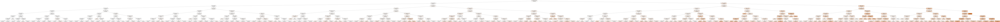

In [ ]:
import graphviz
from sklearn import tree
dot_data = tree.export_graphviz(regressor, out_file='tree.dot',feature_names =list(X.columns.values),rounded = True, proportion = False, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename='tree.png')